In [93]:
# @title
from IPython.core.display import HTML

HTML('''
<div style="text-align: center;">
    <h2 style="
        font-family: 'Arial Black', Gadget, sans-serif;
        font-size: 36px;
        background: linear-gradient(45deg, black, lightblue);
        -webkit-background-clip: text;
        -webkit-text-fill-color: transparent;
        text-shadow: 2px 2px 5px rgba(0,0,0,0.3);
    ">
        Bikes Sharing Count Prediction
    </h2>
    <img src="https://media3.giphy.com/media/v1.Y2lkPTc5MGI3NjExN3VuMWJoNGc4c3ludjgwMDU5Y2hkZmMwbm9jbTM4djk3MmlzdnBkcSZlcD12MV9pbnRlcm5hbF9naWZfYnlfaWQmY3Q9cw/UW78hs8y6rKG9a0oDM/giphy.gif" width="500">
</div>
''')

In [3]:
# @title
#!pip install ydata_profiling
#!pip install tensorflow

In [94]:
# @title
from ydata_profiling import ProfileReport
import pandas as pd
import numpy as np
import warnings
warnings.filterwarnings('ignore')

df= pd.read_csv('/content/hour.csv')
profile= ProfileReport(df, title='Pandas Profiling Report')
profile.to_file(output_file='output.html')

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 17/17 [00:00<00:00, 36.81it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [95]:
profile

In [6]:
df.columns

Index(['instant', 'dteday', 'season', 'yr', 'mnth', 'hr', 'holiday', 'weekday',
       'workingday', 'weathersit', 'temp', 'atemp', 'hum', 'windspeed',
       'casual', 'registered', 'cnt'],
      dtype='object')

In [7]:
df.head()

,instant,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,2011-01-01,1,0,1,0,0,6,0,1,0.24,0.2879,0.81,0.0,3,13,16
1,2,2011-01-01,1,0,1,1,0,6,0,1,0.22,0.2727,0.80,0.0,8,32,40
2,3,2011-01-01,1,0,1,2,0,6,0,1,0.22,0.2727,0.80,0.0,5,27,32
3,4,2011-01-01,1,0,1,3,0,6,0,1,0.24,0.2879,0.75,0.0,3,10,13
4,5,2011-01-01,1,0,1,4,0,6,0,1,0.24,0.2879,0.75,0.0,0,1,1


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17379 entries, 0 to 17378
Data columns (total 17 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   instant     17379 non-null  int64  
 1   dteday      17379 non-null  object 
 2   season      17379 non-null  int64  
 3   yr          17379 non-null  int64  
 4   mnth        17379 non-null  int64  
 5   hr          17379 non-null  int64  
 6   holiday     17379 non-null  int64  
 7   weekday     17379 non-null  int64  
 8   workingday  17379 non-null  int64  
 9   weathersit  17379 non-null  int64  
 10  temp        17379 non-null  float64
 11  atemp       17379 non-null  float64
 12  hum         17379 non-null  float64
 13  windspeed   17379 non-null  float64
 14  casual      17379 non-null  int64  
 15  registered  17379 non-null  int64  
 16  cnt         17379 non-null  int64  
dtypes: float64(4), int64(12), object(1)
memory usage: 2.3+ MB


In [9]:
df.shape

(17379, 17)

In [10]:
df.describe()

,instant,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
count,17379.0000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000
mean,8690.0000,2.501640,0.502561,6.537775,11.546752,0.028770,3.003683,0.682721,1.425283,0.496987,0.475775,0.627229,0.190098,35.676218,153.786869,189.463088
std,5017.0295,1.106918,0.500008,3.438776,6.914405,0.167165,2.005771,0.465431,0.639357,0.192556,0.171850,0.192930,0.122340,49.305030,151.357286,181.387599
min,1.0000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.020000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,4345.5000,2.000000,0.000000,4.000000,6.000000,0.000000,1.000000,0.000000,1.000000,0.340000,0.333300,0.480000,0.104500,4.000000,34.000000,40.000000
50%,8690.0000,3.000000,1.000000,7.000000,12.000000,0.000000,3.000000,1.000000,1.000000,0.500000,0.484800,0.630000,0.194000,17.000000,115.000000,142.000000
75%,13034.5000,3.000000,1.000000,10.000000,18.000000,0.000000,5.000000,1.000000,2.000000,0.660000,0.621200,0.780000,0.253700,48.000000,220.000000,281.000000
max,17379.0000,4.000000,1.000000,12.000000,23.000000,1.000000,6.000000,1.000000,4.000000,1.000000,1.000000,1.000000,0.850700,367.000000,886.000000,977.000000


In [11]:
df.describe(include='O')

,dteday
count,17379
unique,731
top,2012-12-31
freq,24


In [12]:
df.duplicated().sum()

np.int64(0)

In [13]:
df.isnull().sum().sum()

np.int64(0)

#**___________________**

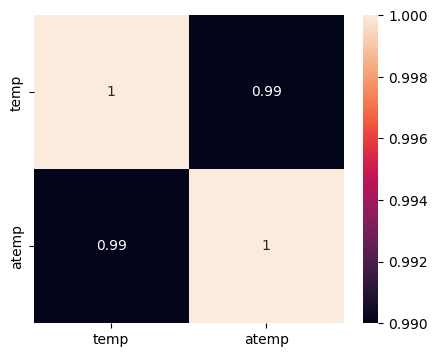

In [14]:
# @title
import seaborn as sns
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(5, 4))

sns.heatmap(df[['temp', 'atemp']].corr().round(2), annot=True)
plt.show()

In [15]:
X = df.drop(columns=['cnt', 'instant', 'dteday', 'casual', 'registered', 'atemp'])

y = df['cnt']

#####variables '**casual**' and '**registered**' were removed before model training to prevent data leakage
#####the '**dteday**' column was excluded from modeling to avoid redundancy
#####'**atemp**' is removed because it is highly correlated with 'temp' (correlation ≈ 0.99)

In [16]:
X.shape

(17379, 11)

In [17]:
X['hr_sin'] = np.sin(2 * np.pi * X['hr'] / 24)
X['hr_cos'] = np.cos(2 * np.pi * X['hr'] / 24)

In [18]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, shuffle=True
)

In [19]:
X_train.shape, y_train.shape, X_test.shape, y_test.shape

((13903, 13), (13903,), (3476, 13), (3476,))

In [20]:
X_train.columns

Index(['season', 'yr', 'mnth', 'hr', 'holiday', 'weekday', 'workingday',
       'weathersit', 'temp', 'hum', 'windspeed', 'hr_sin', 'hr_cos'],
      dtype='object')

#**__________________**

##**Univarite Analysis**

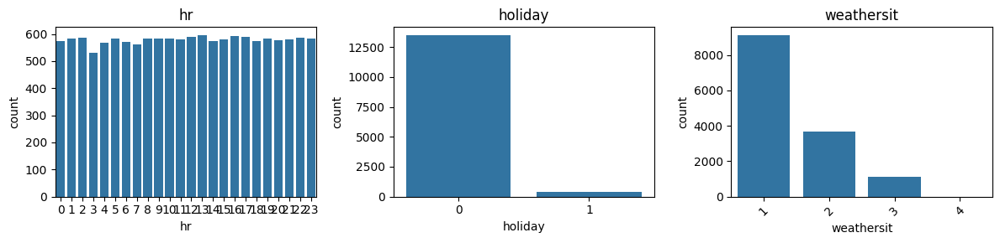

In [21]:
# @title
cat_cols = ['hr', 'holiday', 'weathersit']

plt.figure(figsize=(12,3))
for i, col in enumerate(cat_cols, 1):
    plt.subplot(1, 3, i)
    sns.countplot(x=X_train[col])
    plt.title(col)

    # Rotate x-axis labels فقط للـ weathersit
    if col == 'weathersit':
        plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

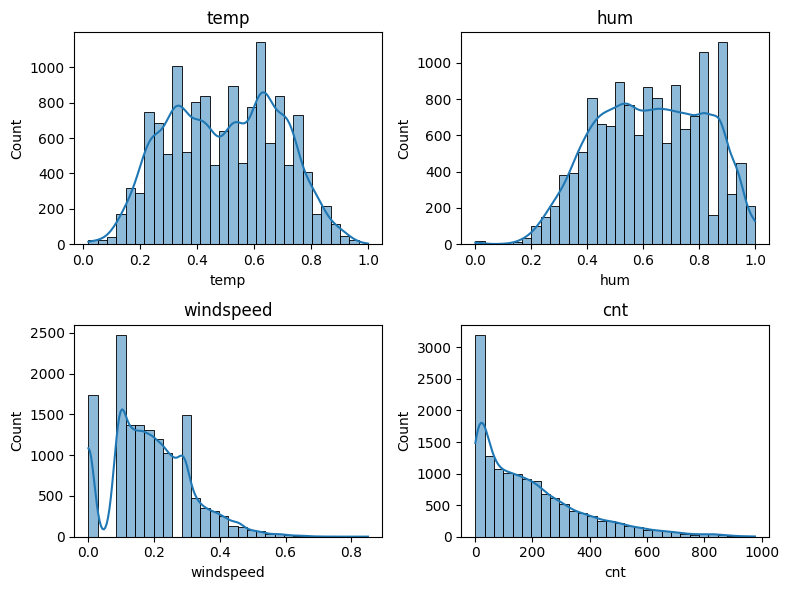

In [22]:
# @title
num_cols = ['temp', 'hum', 'windspeed'] # Columns from X_train

# Create a temporary DataFrame for plotting numerical features from X_train and y_train
df_train_for_plotting = pd.concat([X_train[num_cols], y_train], axis=1)

plt.figure(figsize=(8,6))
for i, col in enumerate(num_cols + ['cnt'], 1):
    plt.subplot(2, 2, i)
    sns.histplot(df_train_for_plotting[col], kde=True, bins=30)
    plt.title(col)

plt.tight_layout()
plt.show()

##**Bivariate Analysis**

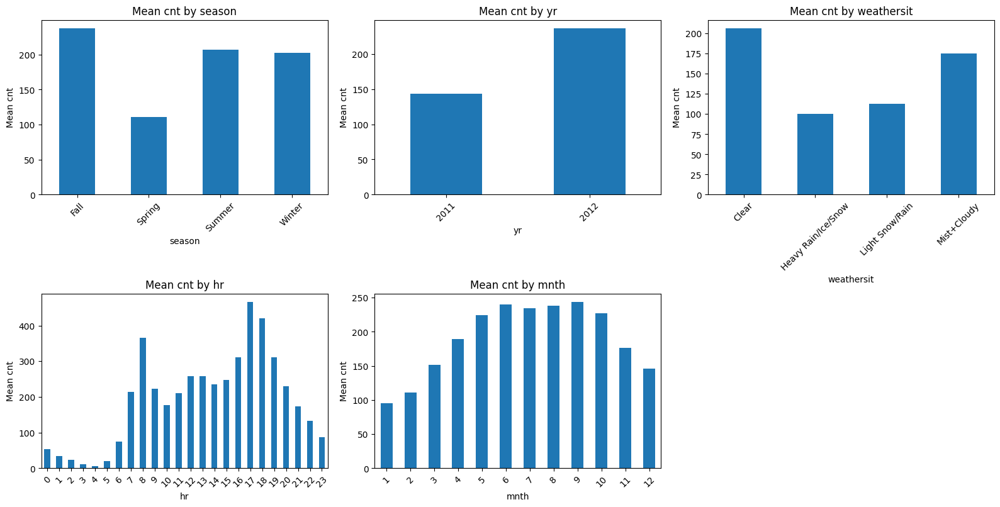

In [23]:
# @title
import pandas as pd
import matplotlib.pyplot as plt

# Combine X_train and y_train for bivariate analysis
# Ensure 'season', 'weathersit', 'yr' are in their original numeric form for mapping.
# X_train might have been modified in-place before this cell, so retrieve original values from X.
df_train_bivariate = pd.concat([
    X.loc[X_train.index, ['season', 'yr', 'weathersit', 'hr', 'mnth', 'holiday', 'weekday', 'workingday', 'temp', 'hum', 'windspeed']].copy(),
    y_train.copy()
], axis=1)

# Now, map the numeric codes to descriptive strings
df_train_bivariate['season'] = df_train_bivariate['season'].map({1:'Spring', 2:'Summer', 3:'Fall', 4:'Winter'})
df_train_bivariate['weathersit'] = df_train_bivariate['weathersit'].map({1:'Clear', 2:'Mist+Cloudy', 3:'Light Snow/Rain', 4:'Heavy Rain/Ice/Snow'})
df_train_bivariate['yr'] = df_train_bivariate['yr'].map({0:'2011', 1:'2012'})

cat_cols = ['season', 'yr', 'weathersit', 'hr', 'mnth']

plt.figure(figsize=(16,12))
for i, col in enumerate(cat_cols, 1):
    plt.subplot(3,3,i)
    df_train_bivariate.groupby(col)['cnt'].mean().plot(kind='bar')
    plt.title(f'Mean cnt by {col}')
    plt.xlabel(col)
    plt.ylabel('Mean cnt')
    plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

##**Multivariate Analysis**

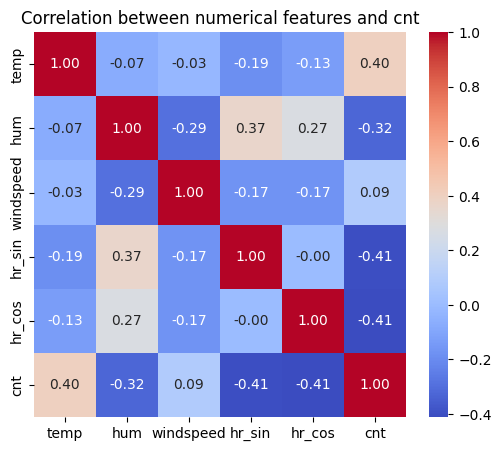

In [24]:
# @title
import seaborn as sns
import matplotlib.pyplot as plt

num_cols = ['temp', 'hum', 'windspeed', 'hr_sin', 'hr_cos']

df_num = pd.concat([X_train[num_cols], y_train], axis=1)

plt.figure(figsize=(6,5))
sns.heatmap(df_num.corr(), annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation between numerical features and cnt')
plt.show()

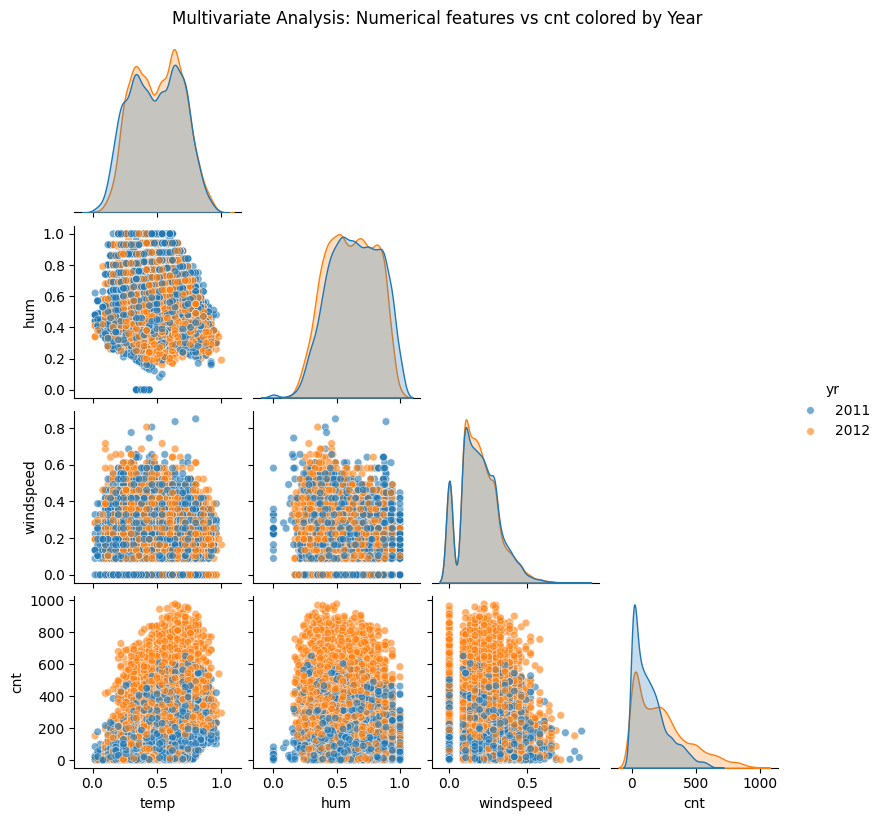

In [25]:
# @title
# ندمج 'yr' مع البيانات الرقمية عشان نلون scatter حسب السنة
df_pairplot = df_train_bivariate[['temp', 'hum', 'windspeed', 'cnt', 'yr']]

sns.pairplot(
    df_pairplot,
    hue='yr',            # تلوين حسب السنة
    corner=True,         # شكل triangular
    height=2,            # حجم صغير لكل subplot
    plot_kws={'alpha':0.6, 's':30}  # شفافية وحجم النقاط
)
plt.suptitle("Multivariate Analysis: Numerical features vs cnt colored by Year", y=1.02)
plt.show()

##**Detect Outlier**

In [26]:
# @title
from scipy import stats
import numpy as np

# الأعمدة الرقمية لفحص القيم الشاذة
numerical_features_for_outliers = ['temp', 'hum', 'windspeed']

all_zscore_outlier_indices = set()

print("="*50)
print("📊 Z-score Outlier Detection on X_train features")
print("="*50)

for col in numerical_features_for_outliers:
    z_scores = np.abs(stats.zscore(X_train[col]))
    current_col_outlier_indices = X_train[z_scores > 3].index.tolist()
    all_zscore_outlier_indices.update(current_col_outlier_indices)
    print(f"🔹 {col:<12} : {len(current_col_outlier_indices):>4} outliers")

print("-"*50)
total_zscore_outliers = len(all_zscore_outlier_indices)
pct_zscore_outliers = (total_zscore_outliers / len(X_train)) * 100
print(f"✅ Total unique outliers across features : {total_zscore_outliers} / {len(X_train)} rows")
print(f"📌 Percentage of Z-score outliers     : {pct_zscore_outliers:.2f}%")
print("="*50)

📊 Z-score Outlier Detection on X_train features
🔹 temp         :    0 outliers
🔹 hum          :   18 outliers
🔹 windspeed    :   84 outliers
--------------------------------------------------
✅ Total unique outliers across features : 101 / 13903 rows
📌 Percentage of Z-score outliers     : 0.73%


In [27]:
# @title
from sklearn.ensemble import IsolationForest
import pandas as pd # Ensure pandas is imported for DataFrame operations

# Define numerical features from X_train for outlier detection
numerical_features_for_outliers = ['temp', 'hum', 'windspeed']

# Create a temporary DataFrame for outlier detection to avoid modifying X_train directly
X_train_numeric_for_outliers = X_train[numerical_features_for_outliers].copy()


contamination_estimate = 0.0073  # أي حوالي 0.73%
iso = IsolationForest(contamination=contamination_estimate, random_state=42)
yhat_iso = iso.fit_predict(X_train_numeric_for_outliers)

# -1 means outlier
X_train_numeric_for_outliers['outlier_iso'] = yhat_iso
print("IsolationForest Outlier Detection on X_train features:")
print(X_train_numeric_for_outliers['outlier_iso'].value_counts())

# Select all outliers
outliers_iso = X_train_numeric_for_outliers[X_train_numeric_for_outliers['outlier_iso'] == -1]
print(f"Shape of IsolationForest outliers in X_train: {outliers_iso.shape}")

IsolationForest Outlier Detection on X_train features:
outlier_iso
 1    13801
-1      102
Name: count, dtype: int64
Shape of IsolationForest outliers in X_train: (102, 4)


In [28]:
X_train_clean = X_train[X_train_numeric_for_outliers['outlier_iso'] != -1].copy()
y_train_clean = y_train[X_train_numeric_for_outliers['outlier_iso'] != -1].copy()

In [29]:
X_train_clean.shape, y_train_clean.shape

((13801, 13), (13801,))

###**Distribution and Skewness of Numerical Features**

Skewness of numerical features:
temp         : -0.015 → ✅ normal
hum          : -0.098 → ✅ normal
windspeed    :  0.489 → ✅ normal




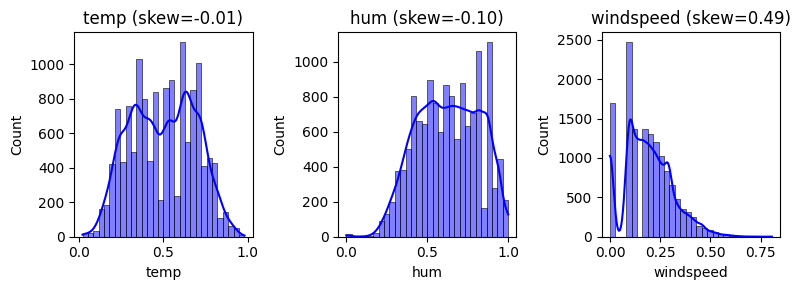

In [30]:
# @title
import matplotlib.pyplot as plt
import seaborn as sns

num_cols_for_skew = ['temp', 'hum', 'windspeed']
skew_values = X_train_clean[num_cols_for_skew].skew()

print("Skewness of numerical features:")
for col, val in skew_values.items():
    status = "✅ normal"if abs(val) < 0.5 else "⚠️ can change"
    print(f"{col:<12} : {val:>6.3f} → {status}")
print("\n")

plt.figure(figsize=(8,3))
for i, col in enumerate(num_cols_for_skew, 1):
    plt.subplot(1,3,i)
    sns.histplot(X_train_clean[col], kde=True, bins=30, color='blue')
    plt.title(f'{col} (skew={X_train_clean[col].skew():.2f})')
plt.tight_layout()
plt.show()

##**Encoding**

In [31]:
X_train_clean.dtypes

,0
season,int64
yr,int64
mnth,int64
hr,int64
holiday,int64
weekday,int64
workingday,int64
weathersit,int64
temp,float64
hum,float64


In [32]:
nominal_cols = ['season','weathersit','yr']  # لا يوجد ترتيب حقيقي بينهم
X_train_encoded = pd.get_dummies(X_train_clean, columns=nominal_cols, drop_first=True)

##**Scaling**

In [33]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train_encoded[num_cols] = scaler.fit_transform(X_train_encoded[num_cols])

##**Preprocessing X_test**

In [34]:
X_test_encoded = pd.get_dummies(X_test, columns=nominal_cols, drop_first=True)

X_test_encoded[num_cols] = scaler.transform(X_test_encoded[num_cols])

In [35]:
X_train_encoded.shape, X_test_encoded.shape

((13801, 17), (3476, 17))

###**Bike Sharing Prediction Models**
###**Using Deep Learning**

In [36]:
# @title
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.regularizers import l2
from tensorflow.keras.optimizers import Adam

# -----------------------------
# Step 1: Build the improved model
# -----------------------------
model = Sequential([
    Dense(128, activation='swish', kernel_regularizer=l2(0.001), input_shape=(X_train_encoded.shape[1],)),
    Dropout(0.3),
    Dense(64, activation='swish', kernel_regularizer=l2(0.001)),
    Dense(32, activation='swish', kernel_regularizer=l2(0.001)),  # Added extra hidden layer
    Dense(1)  # Regression output
])

# -----------------------------
# Step 2: Compile the model
# -----------------------------
optimizer = Adam(learning_rate=0.0005)  # Lower LR can improve training stability
model.compile(optimizer=optimizer, loss='mse', metrics=['mae'])

# -----------------------------
# Step 3: EarlyStopping Callback
# -----------------------------
early_stop = EarlyStopping(
    monitor='val_loss',
    patience=15,   # patience increased slightly
    restore_best_weights=True
)

# -----------------------------
# Step 4: Train the model
# -----------------------------
history = model.fit(
    X_train_encoded, y_train_clean,
    validation_split=0.2,
    epochs=150,
    batch_size=32,
    callbacks=[early_stop],
    verbose=1
)

# -----------------------------
# Step 5: Evaluate on test set
# -----------------------------
test_loss, test_mae = model.evaluate(X_test_encoded, y_test, verbose=1)
print(f"✅ Test MAE: {test_mae:.2f}")

# -----------------------------
# Step 6: Save the trained model
# -----------------------------
model.save('bike_count_model_improved.h5')
print("✅ Improved deep learning model saved successfully as 'bike_count_model_improved.h5'!")

Epoch 1/150
345/345 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 50415.8281 - mae: 154.5179 - val_loss: 19307.3301 - val_mae: 98.5752
Epoch 2/150
345/345 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 18343.9609 - mae: 96.3021 - val_loss: 15662.3916 - val_mae: 87.3595
Epoch 3/150
345/345 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 15642.7363 - mae: 87.1372 - val_loss: 13503.3955 - val_mae: 81.9144
Epoch 4/150
345/345 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 13516.6094 - mae: 80.6223 - val_loss: 11479.5244 - val_mae: 70.1486
Epoch 5/150
345/345 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 11155.8115 - mae: 71.9502 - val_loss: 9551.6836 - val_mae: 66.1581
Epoch 6/150
345/345 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 10064.9082 - mae: 68.1806 - val_loss: 8411.2471 - val_mae: 61.6258
Epoch 7/150
345/345 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 9015.9707 - mae: 64.3908 - val_loss: 7481.6763 - val_mae: 56.4058
Epoch 8/150
345/345 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 7736.2788 - mae: 59.1803 - val_loss: 66

✅ Test MAE: 26.10
✅ Improved deep learning model saved successfully as 'bike_count_model_improved.h5'!


In [80]:
# @title
import pandas as pd
from tensorflow.keras.models import load_model
from tensorflow.keras import backend as K
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np

# ---------------------------
# Define custom metric
# ---------------------------
def mse(y_true, y_pred):
    return K.mean(K.square(y_pred - y_true))

# ---------------------------
# Load model
# ---------------------------
model = load_model('/content/bike_count_model_improved.h5', custom_objects={'mse': mse})

# ---------------------------
# Predict
# ---------------------------
y_pred_test = model.predict(X_test_encoded)
y_pred_val  = model.predict(X_val)  # Corrected: Use X_val instead of X_val_encoded

# ---------------------------
# Calculate metrics
# ---------------------------
metrics = {
    "Set": ["Validation", "Test"],
    "MAE": [
        mean_absolute_error(y_val, y_pred_val),
        mean_absolute_error(y_test, y_pred_test)
    ],
    "MSE": [
        mean_squared_error(y_val, y_pred_val),
        mean_squared_error(y_test, y_pred_test)
    ],
    "RMSE": [
        np.sqrt(mean_squared_error(y_val, y_pred_val)),
        np.sqrt(mean_squared_error(y_test, y_pred_test))
    ],
    "R2": [
        r2_score(y_val, y_pred_val),
        r2_score(y_test, y_pred_test)
    ]
}

# ---------------------------
# Create DataFrame
# ---------------------------
df_metrics = pd.DataFrame(metrics)
df_metrics

109/109 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
87/87 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


,Set,MAE,MSE,RMSE,R2
0,Validation,24.415865,1482.066772,38.497620,0.953014
1,Test,26.103092,1791.258667,42.323264,0.943432


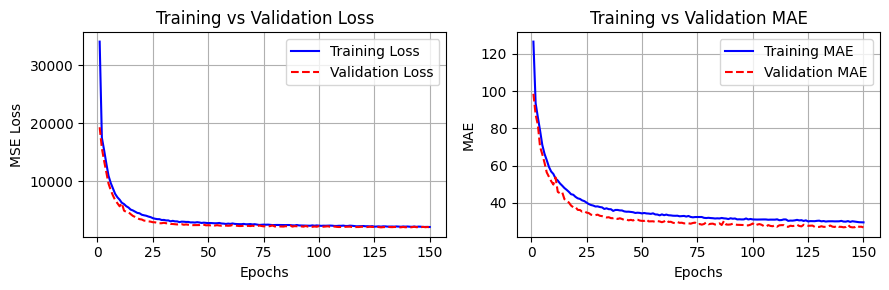

In [38]:
# @title
import matplotlib.pyplot as plt

# استخرج البيانات من history
loss = history.history['loss']
val_loss = history.history['val_loss']
mae = history.history['mae']
val_mae = history.history['val_mae']
epochs = range(1, len(loss)+1)

# -----------------------------
# Plot Loss
# -----------------------------
plt.figure(figsize=(9,3))

plt.subplot(1,2,1)
plt.plot(epochs, loss, 'b-', label='Training Loss')
plt.plot(epochs, val_loss, 'r--', label='Validation Loss')
plt.title('Training vs Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('MSE Loss')
plt.legend()
plt.grid(True)

# -----------------------------
# Plot MAE
# -----------------------------
plt.subplot(1,2,2)
plt.plot(epochs, mae, 'b-', label='Training MAE')
plt.plot(epochs, val_mae, 'r--', label='Validation MAE')
plt.title('Training vs Validation MAE')
plt.xlabel('Epochs')
plt.ylabel('MAE')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

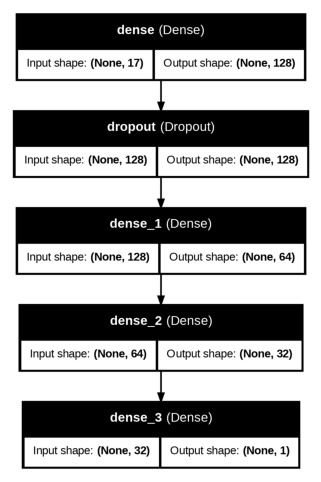

In [39]:
# @title
from tensorflow.keras.utils import plot_model
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# حفظ الصورة
plot_model(model, to_file='model.png', show_shapes=True, show_layer_names=True)

# عرض الصورة باستخدام matplotlib بحجم أصغر
img = mpimg.imread('model.png')
plt.figure(figsize=(8, 6))  # هنا تختاري حجم الصورة (عرض × ارتفاع)
plt.imshow(img)
plt.axis('off')
plt.show()

#**Bike Sharing Prediction Models**
#**Using Machine Learning**

###*Decision Tree Regressor*

In [40]:
# @title
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import pandas as pd
import numpy as np

# -----------------------------
# Feature Selection based on importance threshold
# -----------------------------
# Initial tree to get feature importances
dt_initial = DecisionTreeRegressor(random_state=42)
dt_initial.fit(X_train_encoded, y_train_clean)

importances = pd.Series(dt_initial.feature_importances_, index=X_train_encoded.columns)
important_features = importances[importances > 0.01].index  # keep features with importance > 0.01

X_train_imp = X_train_encoded[important_features]
X_test_imp = X_test_encoded[important_features]

# -----------------------------
# Split Train into Train + Validation
# -----------------------------
X_train_sub, X_val, y_train_sub, y_val = train_test_split(
    X_train_imp, y_train_clean, test_size=0.2, random_state=42
)

# -----------------------------
# Hyperparameter Grid
# -----------------------------
param_grid = {
    'max_depth': [10, 12, 15],
    'min_samples_split': [10, 20, 30],
    'min_samples_leaf': [2, 5, 10],
    'max_features': [None, 'sqrt', 'log2']
}

dt = DecisionTreeRegressor(random_state=42)

grid_search = GridSearchCV(
    dt,
    param_grid,
    cv=5,
    scoring='r2',
    n_jobs=-1
)

# -----------------------------
# Fit Grid Search
# -----------------------------
grid_search.fit(X_train_sub, y_train_sub)

# -----------------------------
# Best Model
# -----------------------------
best_dt = grid_search.best_estimator_

# -----------------------------
# Predictions
# -----------------------------
y_train_pred = best_dt.predict(X_train_sub)
y_val_pred = best_dt.predict(X_val)
y_test_pred = best_dt.predict(X_test_imp)

# -----------------------------
# Metrics
# -----------------------------
results = pd.DataFrame({
    'R2_Train': [r2_score(y_train_sub, y_train_pred)],
    'R2_Validation': [r2_score(y_val, y_val_pred)],
    'R2_Test': [r2_score(y_test, y_test_pred)],
    'MAE_Train': [mean_absolute_error(y_train_sub, y_train_pred)],
    'RMSE_Train': [np.sqrt(mean_squared_error(y_train_sub, y_train_pred))],
    'MAE_Test': [mean_absolute_error(y_test, y_test_pred)],
    'RMSE_Test': [np.sqrt(mean_squared_error(y_test, y_test_pred))]
})

print("Optimized Decision Tree Regression Results with Feature Selection")
display(results)

# -----------------------------
# Show Best Parameters separately
# -----------------------------
print("Best Hyperparameters found by Grid Search:")
print(grid_search.best_params_)

# -----------------------------
# Show Selected Features
# -----------------------------
print("\nSelected Features based on importance (>0.01):")
print(list(important_features))

Optimized Decision Tree Regression Results with Feature Selection


,R2_Train,R2_Validation,R2_Test,MAE_Train,RMSE_Train,MAE_Test,RMSE_Test
0,0.953066,0.914235,0.9115,24.334669,39.716389,31.91716,52.937531


Best Hyperparameters found by Grid Search:
{'max_depth': 15, 'max_features': None, 'min_samples_leaf': 2, 'min_samples_split': 20}

Selected Features based on importance (>0.01):
['mnth', 'hr', 'weekday', 'workingday', 'temp', 'hum', 'windspeed', 'hr_sin', 'hr_cos', 'season_4', 'weathersit_3', 'yr_1']


##*KNN Regressor*

In [41]:
# @title
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import RandomizedSearchCV, train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import pandas as pd
import numpy as np

# -----------------------------
# Split Train into Train + Validation
# -----------------------------
X_train_sub, X_val, y_train_sub, y_val = train_test_split(
    X_train_encoded, y_train_clean, test_size=0.2, random_state=42
)

# -----------------------------
# Define KNN and Hyperparameter Space
# -----------------------------
knn = KNeighborsRegressor()

param_dist = {
    'n_neighbors': list(range(3, 21)),  # جربنا n_neighbors من 3 لحد 20
    'weights': ['uniform', 'distance'],
    'p': [1, 2]  # 1=Manhattan, 2=Euclidean
}

# -----------------------------
# Randomized Search (fast)
# -----------------------------
random_search = RandomizedSearchCV(
    knn,
    param_distributions=param_dist,
    n_iter=25,       # عدد التجارب العشوائية
    scoring='r2',
    cv=3,
    verbose=1,
    n_jobs=-1,
    random_state=42
)

# -----------------------------
# Fit RandomizedSearch
# -----------------------------
random_search.fit(X_train_sub, y_train_sub)

# -----------------------------
# Best KNN Model
# -----------------------------
best_knn = random_search.best_estimator_

# -----------------------------
# Predictions
# -----------------------------
y_train_pred = best_knn.predict(X_train_sub)
y_val_pred   = best_knn.predict(X_val)
y_test_pred  = best_knn.predict(X_test_encoded)

# -----------------------------
# Metrics
# -----------------------------
results_knn = pd.DataFrame({
    'R2_Train': [r2_score(y_train_sub, y_train_pred)],
    'R2_Validation': [r2_score(y_val, y_val_pred)],
    'R2_Test': [r2_score(y_test, y_test_pred)],
    'MAE_Train': [mean_absolute_error(y_train_sub, y_train_pred)],
    'RMSE_Train': [np.sqrt(mean_squared_error(y_train_sub, y_train_pred))],
    'MAE_Validation': [mean_absolute_error(y_val, y_val_pred)],
    'RMSE_Validation': [np.sqrt(mean_squared_error(y_val, y_val_pred))],
    'MAE_Test': [mean_absolute_error(y_test, y_test_pred)],
    'RMSE_Test': [np.sqrt(mean_squared_error(y_test, y_test_pred))]
})

print("KNN Regression Results After Fine Hyperparameter Tuning")
display(results_knn)

# -----------------------------
# Best Hyperparameters separately
# -----------------------------
print("Best Hyperparameters found for KNN:")
print(random_search.best_params_)

Fitting 3 folds for each of 25 candidates, totalling 75 fits
KNN Regression Results After Fine Hyperparameter Tuning


,R2_Train,R2_Validation,R2_Test,MAE_Train,RMSE_Train,MAE_Validation,RMSE_Validation,MAE_Test,RMSE_Test
0,0.999987,0.90163,0.903399,0.017935,0.668047,35.632335,55.703368,35.387501,55.307496


Best Hyperparameters found for KNN:
{'weights': 'distance', 'p': 1, 'n_neighbors': 5}


##*XGBoost*

In [62]:
# @title
import numpy as np
import matplotlib.pyplot as plt
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# ===============================
# 1️⃣ Log Transformation
# ===============================
y_train_log = np.log1p(y_train_clean)
y_val_log   = np.log1p(y_val)
y_test_log  = np.log1p(y_test)

# ===============================
# 2️⃣ Build Model
# ===============================
xgb_model = XGBRegressor(
    n_estimators=600,
    learning_rate=0.03,
    max_depth=10,
    min_child_weight=3,
    subsample=0.85,
    colsample_bytree=0.85,
    gamma=0.1,
    reg_alpha=0.1,
    reg_lambda=1.2,
    objective='reg:squarederror',
    random_state=42,
    n_jobs=-1
)

# ===============================
# 3️⃣ Train (بدون EarlyStopping)
# ===============================
xgb_model.fit(X_train_encoded, y_train_log)

# ===============================
# 4️⃣ Predictions (Inverse Log)
# ===============================
y_train_pred = np.expm1(xgb_model.predict(X_train_encoded))
y_val_pred   = np.expm1(xgb_model.predict(X_val))
y_test_pred  = np.expm1(xgb_model.predict(X_test_encoded))

# ===============================
# 5️⃣ Metrics Function
# ===============================
def regression_metrics(y_true, y_pred):
    mae = mean_absolute_error(y_true, y_pred)
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    r2 = r2_score(y_true, y_pred)
    return r2, mae, rmse

# ===============================
# 6️⃣ Calculate Metrics
# ===============================
R2_Train, MAE_Train, RMSE_Train = regression_metrics(y_train_clean, y_train_pred)
R2_Validation, MAE_Validation, RMSE_Validation = regression_metrics(y_val, y_val_pred)
R2_Test, MAE_Test, RMSE_Test = regression_metrics(y_test, y_test_pred)

import pandas as pd

# جمع النتائج في قاموس
metrics_dict = {
    "R2_Train": [R2_Train],
    "R2_Validation": [R2_Validation],
    "R2_Test": [R2_Test],
    "MAE_Train": [MAE_Train],
    "RMSE_Train": [RMSE_Train],
    "MAE_Validation": [MAE_Validation],
    "RMSE_Validation": [RMSE_Validation],
    "MAE_Test": [MAE_Test],
    "RMSE_Test": [RMSE_Test]
}

# تحويله إلى DataFrame
metrics_df = pd.DataFrame(metrics_dict)
metrics_df

,R2_Train,R2_Validation,R2_Test,MAE_Train,RMSE_Train,MAE_Validation,RMSE_Validation,MAE_Test,RMSE_Test
0,0.973782,0.974782,0.949998,17.626469,29.502556,17.153887,28.203815,23.21978,39.790962


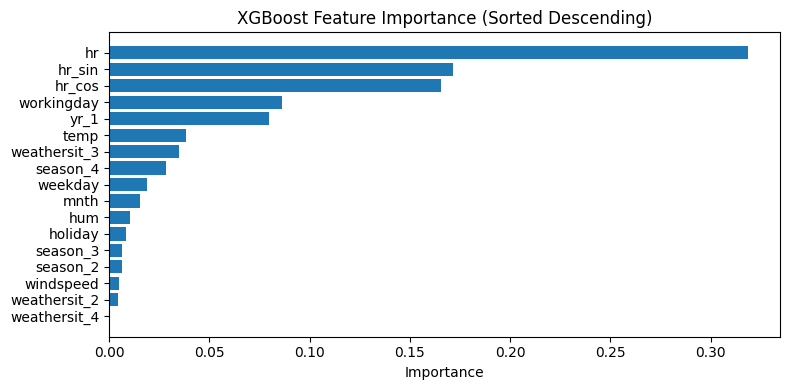

In [64]:
# @title
# Feature Importance
feature_importance_df = pd.DataFrame({
    "Feature": X_train_encoded.columns,
    "Importance": xgb_model.feature_importances_
})

# ترتيب تنازلي حسب الأهمية
feature_importance_df = feature_importance_df.sort_values(by="Importance", ascending=False)

# عرض DataFrame
feature_importance_df

# رسم بياني أفقي مرتب
plt.figure(figsize=(8,4))
plt.barh(feature_importance_df["Feature"], feature_importance_df["Importance"])
plt.xlabel("Importance")
plt.title("XGBoost Feature Importance (Sorted Descending)")
plt.gca().invert_yaxis()  # لجعل الأعلى أهمية في الأعلى
plt.tight_layout()
plt.show()

## *Random Forest Regressor*

In [66]:
# @title
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# ===============================
# 1️⃣ Build Random Forest Model
# ===============================
rf_model = RandomForestRegressor(
    n_estimators=500,
    max_depth=None,
    min_samples_split=5,
    min_samples_leaf=2,
    max_features='sqrt',
    random_state=42,
    n_jobs=-1
)

# ===============================
# 2️⃣ Train
# ===============================
rf_model.fit(X_train_encoded, y_train_clean)

# ===============================
# 3️⃣ Predictions
# ===============================
y_train_pred = rf_model.predict(X_train_encoded)
y_val_pred   = rf_model.predict(X_val)
y_test_pred  = rf_model.predict(X_test_encoded)

# ===============================
# 4️⃣ Metrics Function
# ===============================
def regression_metrics(y_true, y_pred):
    mae = mean_absolute_error(y_true, y_pred)
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    r2 = r2_score(y_true, y_pred)
    return r2, mae, rmse

# ===============================
# 5️⃣ Calculate Metrics
# ===============================
R2_Train, MAE_Train, RMSE_Train = regression_metrics(y_train_clean, y_train_pred)
R2_Validation, MAE_Validation, RMSE_Validation = regression_metrics(y_val, y_val_pred)
R2_Test, MAE_Test, RMSE_Test = regression_metrics(y_test, y_test_pred)

# ===============================
# 6️⃣ Put Metrics in DataFrame
# ===============================
metrics_df = pd.DataFrame({
    'R2_Train':[R2_Train], 'R2_Validation':[R2_Validation], 'R2_Test':[R2_Test],
    'MAE_Train':[MAE_Train], 'RMSE_Train':[RMSE_Train],
    'MAE_Validation':[MAE_Validation], 'RMSE_Validation':[RMSE_Validation],
    'MAE_Test':[MAE_Test], 'RMSE_Test':[RMSE_Test]
})

metrics_df

,R2_Train,R2_Validation,R2_Test,MAE_Train,RMSE_Train,MAE_Validation,RMSE_Validation,MAE_Test,RMSE_Test
0,0.974088,0.974523,0.940168,18.330626,29.329904,17.845162,28.347995,27.324351,43.526927


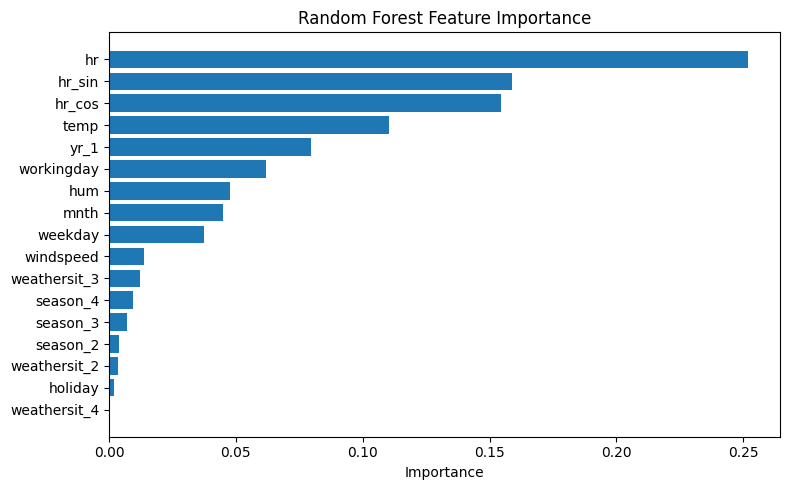

In [67]:
# @title
# ===============================
# 7️⃣ Feature Importance (sorted descending)
# ===============================
feat_imp = pd.DataFrame({
    'Feature': X_train_encoded.columns,
    'Importance': rf_model.feature_importances_
}).sort_values(by='Importance', ascending=False)

plt.figure(figsize=(8,5))
plt.barh(feat_imp['Feature'], feat_imp['Importance'])
plt.gca().invert_yaxis()
plt.title("Random Forest Feature Importance")
plt.xlabel("Importance")
plt.tight_layout()
plt.show()


#*Voting Regressor*

In [70]:
# @title
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from xgboost import XGBRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, VotingRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# ===============================
# 1️⃣ Log Transformation
# ===============================
y_train_log = np.log1p(y_train_clean)
y_val_log   = np.log1p(y_val)
y_test_log  = np.log1p(y_test)

# ===============================
# 2️⃣ Build Models
# ===============================
xgb_model = XGBRegressor(
    n_estimators=600, learning_rate=0.03, max_depth=10,
    min_child_weight=3, subsample=0.85, colsample_bytree=0.85,
    gamma=0.1, reg_alpha=0.1, reg_lambda=1.2,
    objective='reg:squarederror', random_state=42, n_jobs=-1
)

rf_model = RandomForestRegressor(
    n_estimators=500, max_depth=12, random_state=42, n_jobs=-1
)

gb_model = GradientBoostingRegressor(
    n_estimators=500, learning_rate=0.03, max_depth=5, random_state=42
)

voting_model = VotingRegressor(estimators=[
    ('xgb', xgb_model),
    ('rf', rf_model),
    ('gb', gb_model)
])

# ===============================
# 3️⃣ Train all models
# ===============================
xgb_model.fit(X_train_encoded, y_train_log)
rf_model.fit(X_train_encoded, y_train_log)
gb_model.fit(X_train_encoded, y_train_log)
voting_model.fit(X_train_encoded, y_train_log)

# ===============================
# 4️⃣ Predictions (Inverse Log)
# ===============================
def inverse_log(preds):
    return np.expm1(preds)

y_train_pred = inverse_log(voting_model.predict(X_train_encoded))
y_val_pred   = inverse_log(voting_model.predict(X_val))
y_test_pred  = inverse_log(voting_model.predict(X_test_encoded))

# ===============================
# 5️⃣ Metrics Function
# ===============================
def regression_metrics(y_true, y_pred):
    mae = mean_absolute_error(y_true, y_pred)
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    r2 = r2_score(y_true, y_pred)
    return r2, mae, rmse

# ===============================
# 6️⃣ Calculate Metrics & DataFrame
# ===============================
R2_Train, MAE_Train, RMSE_Train = regression_metrics(y_train_clean, y_train_pred)
R2_Validation, MAE_Validation, RMSE_Validation = regression_metrics(y_val, y_val_pred)
R2_Test, MAE_Test, RMSE_Test = regression_metrics(y_test, y_test_pred)

metrics_df = pd.DataFrame({
    'R2_Train': [R2_Train],
    'R2_Validation': [R2_Validation],
    'R2_Test': [R2_Test],
    'MAE_Train': [MAE_Train],
    'RMSE_Train': [RMSE_Train],
    'MAE_Validation': [MAE_Validation],
    'RMSE_Validation': [RMSE_Validation],
    'MAE_Test': [MAE_Test],
    'RMSE_Test': [RMSE_Test]
})

print("📊 Voting Regressor Performance\n")
metrics_df

📊 Voting Regressor Performance



,R2_Train,R2_Validation,R2_Test,MAE_Train,RMSE_Train,MAE_Validation,RMSE_Validation,MAE_Test,RMSE_Test
0,0.965909,0.966128,0.944912,20.376651,33.642176,19.86101,32.686535,24.629888,41.765799


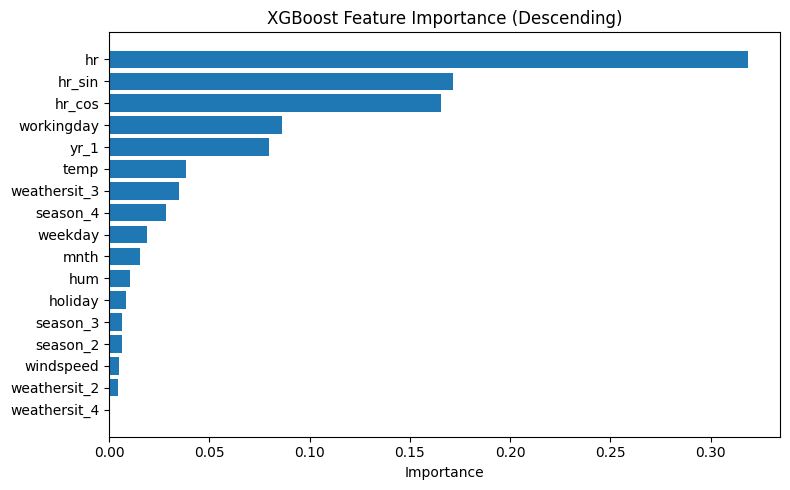

In [71]:
# @title
# ===============================
# 7️⃣ Feature Importance for XGB (Separate Code)
# ===============================
feat_imp_xgb = pd.DataFrame({
    'Feature': X_train_encoded.columns,
    'Importance': xgb_model.feature_importances_
}).sort_values(by='Importance', ascending=False)

plt.figure(figsize=(8,5))
plt.barh(feat_imp_xgb['Feature'], feat_imp_xgb['Importance'])
plt.title("XGBoost Feature Importance (Descending)")
plt.xlabel("Importance")
plt.gca().invert_yaxis()  # أكبر أهمية فوق
plt.tight_layout()
plt.show()

# Comparison of Best ML Models

| Model              | R²_Validation | MAE_Validation | RMSE_Validation | Notes |
|-------------------|---------------|----------------|----------------|-------|
| Optimized Decision Tree | 0.914         | 31.92          | 52.94          | Good, but lower validation score |
| KNN Regression         | 0.902         | 35.63          | 55.70          | Overfitted on train (R²_Train ~ 1.0) |
| XGBoost                | **0.975** ✅   | **17.15** ✅    | **28.20** ✅    | Best overall ML model on validation |
| Random Forest          | 0.975         | 17.85          | 28.35          | Slightly worse than XGBoost |
| Voting Regressor       | 0.966         | 19.86          | 32.69          | Ensemble, good but not best |


# Comparison: Deep Learning vs XGBoost

| Model         | R²      | MAE    | RMSE   | Notes                     |
|---------------|---------|-------|--------|---------------------------|
| XGBoost ✅     | 0.9748  | 17.15 | 28.20  | Best ML model overall     |
| Deep Learning | 0.9530  | 24.42 | 38.50  | Slightly worse than XGBoost |

> ✅ Metrics considered: Higher R², Lower MAE, Lower RMSE


In [98]:
# @title
from IPython.core.display import HTML

HTML('''
<div align='center'>
    <img src="https://media.giphy.com/media/v1.Y2lkPWVjZjA1ZTQ3eDJ1ZzEwOGtnbnhkc2Q2eWRjeW9iZG95MXpwdDQzMmdna2Uyajd5dCZlcD12MV9zdGlja2Vyc19yZWxhdGVkJmN0PXM/8rEWdsu8H37ixrTfnD/giphy.gif" width="500">
</div>
''')